## Getting started

Let's start by importing all the pacakges. If error occurs, please make sure to run `pip install -r requirements.txt`, file which can be find at the root of this repository

In [1]:
import os 
import sys
import inspect

currentdir = os.getcwd()
parentdir = os.path.dirname(currentdir)
sys.path.insert(0, parentdir) 

import pyLLE
import numpy as np
from scipy import constants as cts
import pandas as pd
import pickle as pkl
import plotly.graph_objs as go
import plotly.graph_objs
import plotly.io as pio
import time
pio.renderers.default = "notebook"
pio.templates.default = "seaborn"

************************************************************
Julia solver:
/zhome/d5/3/214816/viswa/fdtd_py/lib64/python3.9/site-packages/pyLLE/ComputeLLE.jl
************************************************************


In [2]:
res = dict(
        R=23e-6, 
        Qi=1e6, 
        Qc=1e6, 
        γ=3.2, 
        dispfile="./RW1000_H430.csv"
)

sim = dict(
    Pin=[160e-3], 
    f_pmp=[283e12],
    φ_pmp=[0], 
    δω=[None], 
    Tscan=0.7e6,
    μ_sim=[-220, 220],
    δω_init= 1e9 * 2 * np.pi,
    δω_end= -6.5e9 * 2 * np.pi,
    num_probe = 5000, 
)


The dispersion file which is available in the example folder is essentially a 2D column coma-separated-value (CSV) file that contain in the first column the azimuthal mode number and in the second the corresponding frequency of resonance. The value of the azimuthal mode number doesn't matter much given it is only to retrieve the effective refractive index and the LLE works in normalized mode number µ (normalized ot the pump). Therefore, as long as the mode number are monotonically increasing by 1, it is all good

Next step is to initialize the solver. Like in previous version, we do the same: 

In [3]:
solver = pyLLE.LLEsolver(sim=sim, res=res,debug=False)

We need to analyze the linear dispersion of the resonator:

In [4]:
fig = solver.Analyze(plot=True)
fig.update_yaxes(range = [-50, 50], title = 'D<sub>int</sub> (GHz)')
fig.show()

## Couple of New Stuff in v4

One first thing to notice compared to previous version is how all the parameters are stored in the _solver_ object:

- first, the solver has a custom print function that allows for easy display fo the parameters: 

- The simulation, resonator and dispersion parameters are stored as an attribute of the _solver_ object, making it much easier to access all parameters: 

In [5]:
solver.disp

+------------------------------------------------------------------------------------------------------------------------+
|  Parameter      Description                           Values                                             Units         |
+------------------------------------------------------------------------------------------------------------------------+
|  ng             [1.760 ... 2.187]                     Group Index                                                      |
|  D              [-4108.943 ... -2129.830]             Dispersion                                         (ps/nm/km)    |
|  neff           [1.412 ... 1.936]                     Effctive Index                                                   |
|  freq           [148.354 ... 587.077] (THz)           Mode frequency                                     Hz            |
|  freq_sim       [67.530 ... 497.761] (THz)            Mode frequency to match the sim domain             Hz            |
|  Dint         

In [6]:
solver.sim

+---------------------------------------------------------------------------------------------------------+
|  Parameter          Description         Values                                      Units               |
+---------------------------------------------------------------------------------------------------------+
|  Pin                [160.000] (mW)      Pump power                                  W                   |
|  Tscan              700000.0            Simulation time length                      unit of round trip  |
|  f_pmp              [282.646] (THz)     Pump frequencies                            Hz                  |
|  φ_pmp              [0]                 Pump phase                                  rad                 |
|  f_center           282.646 (THz)       Center of the sim domain                    Hz                  |
|  δω_init            1.000 (GHz)         Start of the frequency sweep                x2π Hz              |
|  δω_end             -6.500

In [7]:
solver.res

+-----------------------------------------------------------------------------------+
|  Parameter     Description           Values                            Units      |
+-----------------------------------------------------------------------------------+
|  R             23.0                  Ring radius                       µm         |
|  Qi            1.000 x10^6           Intrinsic quality factor                     |
|  Qc            1.000 x10^6           Coupling quality factor                      |
|  γ             3.2                   Non-linear coefficient            W^-1 m^-1  |
|  dispfile      ./RW1000_H430.csv     mode/resonance frequency file                |
+-----------------------------------------------------------------------------------+

- Each of teh parameters listed in the table can simply be accessed as attribute such as: 

In [8]:
print(f"R = {solver.res.R}")
print(f"Pin = {solver.sim.Pin}")
print(f"D1 = {solver.disp.D1*1e-9/(2*np.pi)} x 2π GHz")

R = 2.3e-05
Pin = [0.16]
D1 = 982.262981718388 x 2π GHz


Therfeore to plot stuff it is quite convenient as the integrated dispersion for instance can be retrieved through _solver.disp.Dint_

## Simulation

We will run the simulation, now you can specify where the julia bin is present. 

In [88]:
solver.Setup(verbose = False)
solver.SolveTemporal(bin = 'julia-1.11.1/bin/julia')
solver.RetrieveData()

----------------------------------------------------------------------
2025-12-16 15:19:29
Computing LLE [**************************************************] 100%

Simulation Time 00h:04min:34.8s
----------------------------------------------------------------------


Please note that you might have an error when you RetrieveData() because the hdf5 file took too long on the julia side to write and python is trying to open it. A quick workaround is to wait a bit (using _time.sleep(XX)_ from the time package) or you can make a try/except loop. It will be fixed in further release hopefully

From here, all the solution components Are stored in the _sol_ attribute of the solver object

In [89]:
solver.sol

+-------------------------------------------------------------------------------------------------+
|  Parameter     Description                          Values                               Units  |
+-------------------------------------------------------------------------------------------------+
|  δfreq         [3.500 ... -6.498] (GHz)             Pump detuning                        Hz     |
|  time          [-0.713 ... 1.323] (μs)              Simualtion time                      s      |
|  Awg           [441 fast time x 5000 slow time]     E. field in time domain in wg,       V/m    |
|  Acav          [441 fast time x 5000 slow time]     E. field in time domain in cav.      V/m    |
|  Ewg           [441 spectra x 5000 slow time]       E. field in freq. domain in wg.      V/m    |
|  Ecav          [441 spectra x 5000 slow time]       E. field in freq. domain in cav.     V/m    |
|  Pcomb         [0.000 ... 0.000] (mW)               Intra-cavity comb power              W      |


Retrieveing the intra cavity field power simply becomes: 

In [90]:
fig = go.Figure()

# tr = go.Scatter(x=solver.sol.δfreq*1e-9, y=solver.sol.Pcomb * 1e3)
tr = go.Scatter(y=solver.sol.Pcomb * 1e3)

fig.add_trace(tr)
fig.update_layout(
    xaxis_title="LLE sub-sampled step", yaxis_title="Intra-cavity Power (mW)"
)
fig.add_annotation(x=4500, y=4.9, ax=0, ay=-50, text="Single Soliton Step")
fig.add_annotation(x=3151, y=7.6, ax=0, ay=-50, text="Two Solitons Step")
fig.add_annotation(x=1931, y=16, ax=0, ay=80, text="Modulation Instability")
fig.add_annotation(x=500, y=6, ax=-80, ay=-80, text="Primary Comb")
fig.show()


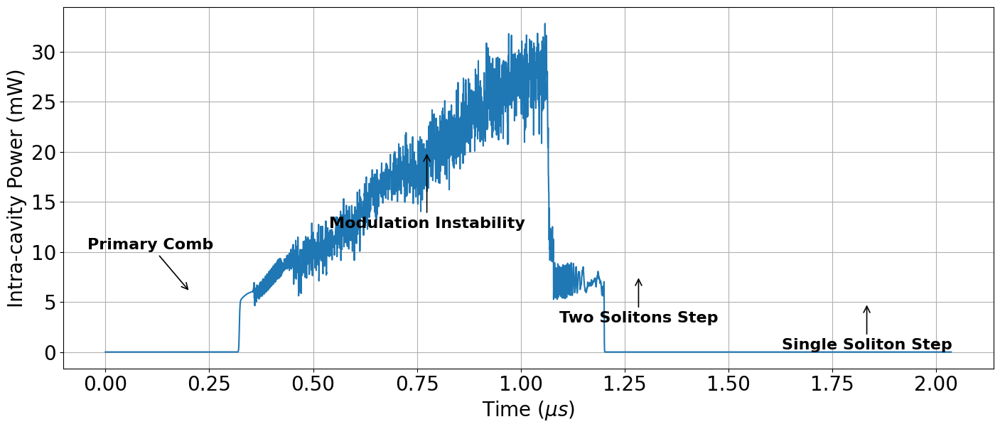

In [70]:
import matplotlib.pyplot as plt
tr = 1/(solver.disp.D1/(2*np.pi))
# tr in microseconds
x = np.linspace(0, 2e6*tr*1e6, solver.sim.num_probe)
y = solver.sol.Pcomb * 1e3
plt.figure(figsize=(14,6))
plt.plot(x,y)
plt.xlabel(r'Time ($\mu s$)', fontsize=20)
plt.ylabel('Intra-cavity Power (mW)', fontsize=20)
annotations = [
    dict(x=x[4500], y=4.9, dx=0,   dy=-50, text="Single Soliton Step"),
    dict(x=x[3151], y=7.6, dx=0,   dy=-50, text="Two Solitons Step"),
    dict(x=x[1900], y=20,  dx=0,   dy=-80,  text="Modulation Instability"),
    dict(x=x[500],  y=6,   dx=-40, dy=40, text="Primary Comb"),
]

ax = plt.gca()
for a in annotations:
    ax.annotate(
        a["text"],
        xy=(a["x"], a["y"]),                 # point to annotate (data coords)
        xytext=(a["dx"], a["dy"]),           # text offset
        textcoords="offset points",          # interpret xytext as pixels/points offset
        ha="center",
        va="bottom",
        arrowprops=dict(arrowstyle="->", lw=1.2),
        fontsize=16,
        fontweight='bold'
    )

plt.tight_layout()
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid()
plt.show()

We can plot the spectra from here, either through the pre compile function or by processing it oursevelve from solver.sol.Ewg: 

In [12]:
solver.PlotCombSpectra(4999, where='waveguide', floor=-60).show()

In [21]:
solver.PlotSolitonTime(3100)

FigureWidget({
    'data': [{'mode': 'lines',
              'type': 'scatter',
              'uid': '90bcf6b9-46e1-43d3-926c-e6c7e112082f',
              'x': array([-0.50902858, -0.50671482, -0.50440105, ...,  0.50440105,  0.50671482,
                           0.50902858]),
              'y': array([3.12713990e-06, 3.58861665e-07, 2.25117939e-08, ..., 2.45315980e-06,
                          2.68779847e-06, 2.49638112e-06])}],
    'layout': {'template': '...', 'xaxis': {'title': {'text': 'Time (ps)'}}, 'yaxis': {'title': {'text': '|E|^2 (norm)'}}}
})

In [12]:
import matplotlib.pyplot as plt

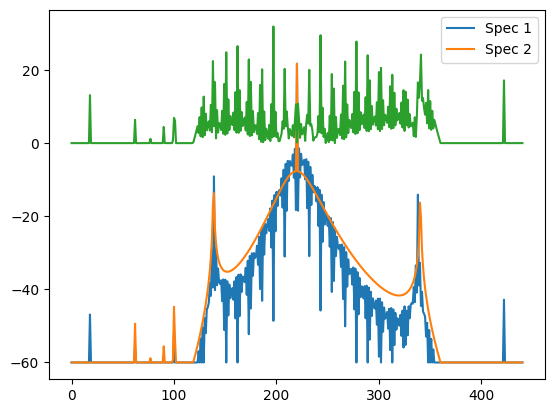

In [13]:
spec1 = 10*np.log10(np.abs(solver.sol.Ewg[:,3000])**2)+30
spec2 = 10*np.log10(np.abs(solver.sol.Ewg[:,4800])**2)+30
spec1 = np.clip(spec1,-60,30)
spec2 = np.clip(spec2, -60,30)

plt.plot(spec1, label='Spec 1')
plt.plot(spec2, label='Spec 2')
plt.legend()
plt.plot(np.abs(spec1-spec2))
plt.show()

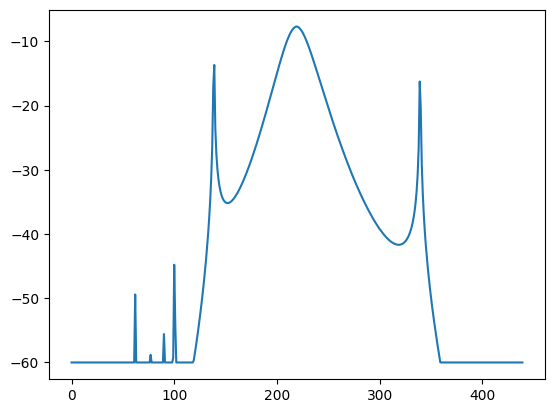

In [14]:
plt.plot(spec2[spec2<10])


In [15]:
def spectral_width_dbm_torch(y_dbm, threshold = -60, center_idx: int = None, norm: int = 300) :
    """
    Counts how many points in y_dbm (PyTorch tensor) are above threshold (dBm), excluding the central mode,
    and divides by norm (default 300).
    """
    if center_idx is None:
        center_idx = y_dbm.shape[0] // 2
    mask = (y_dbm > threshold)
    mask[center_idx] = False  # exclude central mode
    width = np.sum(mask) / norm
    return width.item()

In [16]:
# def spectral_symm(y_dbm, threshold = -60, center_idx: int = None, norm: int = 300) :
#     """
#     Counts how many points in y_dbm (PyTorch tensor) are above threshold (dBm), excluding the central mode,
#     and divides by norm (default 300).
#     """
#     if center_idx is None:
#         center_idx = y_dbm.shape[0] // 2
#     mask = (y_dbm > threshold)
#     # check if mask is false for everything other than central mode
#     if np.sum(mask) <= 1:
#         return 0.0
#     left_modes = y_dbm[:center_idx]*mask[:center_idx]
#     right_modes = y_dbm[center_idx+1:]*mask[center_idx+1:]
#     right_modes_flipped = np.flip(right_modes)
#     # Ensure both sides have the same length for correlation calculation
#     min_len = min(len(left_modes), len(right_modes_flipped))
#     if min_len < 2:  # Correlation requires at least 2 points
#         return 0.0

#     left_modes = left_modes[-min_len:]
#     right_modes_flipped = right_modes_flipped[:min_len]

#     # Calculate Pearson correlation coefficient
#     corr_matrix = np.corrcoef(left_modes, right_modes_flipped)
    
#     # Return the correlation value between the two series
#     return corr_matrix[0, 1]

def spectral_symm(y_dbm, threshold = -58) :
    """
    Counts how many points in y_dbm (PyTorch tensor) are above threshold (dBm), excluding the central mode,
    and divides by norm (default 300).
    """
    n = len(y_dbm)
    center_idx = n // 2

    left = y_dbm[:center_idx]
    right = y_dbm[center_idx+1:]

    left_filtered = left[left > threshold]
    right_filtered = right[right > threshold]

    min_len = min(len(left_filtered), len(right_filtered))
    if min_len < 2:
        return 0.0  # Return zero if no correlation

    left_trim = left_filtered[:min_len]
    right_trim = right_filtered[:min_len]
    right_trim = np.flip(right_trim)

    corr_matrix = np.corrcoef(left_trim, right_trim)

    return corr_matrix[0, 1].item()

In [17]:
def spectral_smoothness(y_dbm, floor=-60, window=5):
    # exclude central mode and anything below floor
    # running mean of y_dbm with window size of window
    running_average = np.convolve(y_dbm, np.ones(window)/window, mode='same')
    mask = np.ones_like(y_dbm)
    mask[y_dbm.shape[0]//2] = 0
    y_dbm = y_dbm * mask
    return np.mean(np.diff(y_dbm)**2)/10

In [18]:
5*(spectral_symm(spec2)-0.5), 5*(spectral_symm(spec1)-0.5)

(1.9398356286422507, 2.164749725524432)

In [19]:
spec1 = 10*np.log10(np.abs(solver.sol.Ewg[:,3000])**2)+30
spec1 = np.clip(spec1,-60,30)
spectral_corr = np.corrcoef(spec1, spec2)[0,1]
ideal=3*spectral_width_dbm_torch(spec2)+10*(spectral_symm(spec2)-0.5) + 2*(np.corrcoef(spec2, spec2)[0,1]-0.5) - 0.25*spectral_smoothness(spec2)
non_ideal=3*spectral_width_dbm_torch(spec1)+10*(spectral_symm(spec1)-0.5) + 2*(np.corrcoef(spec1, spec2)[0,1]-0.5) - 0.25*spectral_smoothness(spec1)
print('Ideal:', ideal)
print('Non-ideal:', non_ideal)
# print induvidual components
print('Ideal Width:', spectral_width_dbm_torch(spec2), 'Non-ideal Width:', spectral_width_dbm_torch(spec1))
print('Ideal Symm:', spectral_symm(spec2), 'Non-ideal Symm:', spectral_symm(spec1))
print('Ideal Corr:', np.corrcoef(spec2, spec2)[0,1], 'Non-ideal Corr:', np.corrcoef(spec1, spec2)[0,1])
print('Ideal Smooth:', spectral_smoothness(spec2), 'Non-ideal Smooth:', spectral_smoothness(spec1))

Ideal: 7.273410080161339
Non-ideal: 5.573473102334648
Ideal Width: 0.8233333333333334 Non-ideal Width: 0.7366666666666667
Ideal Symm: 0.8879671257284502 Non-ideal Symm: 0.9329499451048864
Ideal Corr: 0.9999999999999998 Non-ideal Corr: 0.9397489844840592
Ideal Smooth: 0.3050447084926514 Non-ideal Smooth: 7.382097270729337


In [20]:
spec1 = 10*np.log10(np.abs(solver.sol.Ewg[:,500])**2)+30
spec1 = np.clip(spec1,-60,30)
spectral_corr = np.corrcoef(spec1, spec2)[0,1]
ideal=3*spectral_width_dbm_torch(spec2)+10*(spectral_symm(spec2)-0.5) + 2*(np.corrcoef(spec2, spec2)[0,1]-0.5) - 0.25*spectral_smoothness(spec2)
non_ideal=3*spectral_width_dbm_torch(spec1)+10*(spectral_symm(spec1)-0.5) + 2*(np.corrcoef(spec1, spec2)[0,1]-0.5) - 0.25*spectral_smoothness(spec1)
print('Ideal:', ideal)
print('Non-ideal:', non_ideal)
# print induvidual components
print('Ideal Width:', spectral_width_dbm_torch(spec2), 'Non-ideal Width:', spectral_width_dbm_torch(spec1))
print('Ideal Symm:', spectral_symm(spec2), 'Non-ideal Symm:', spectral_symm(spec1))
print('Ideal Corr:', np.corrcoef(spec2, spec2)[0,1], 'Non-ideal Corr:', np.corrcoef(spec1, spec2)[0,1])
print('Ideal Smooth:', spectral_smoothness(spec2), 'Non-ideal Smooth:', spectral_smoothness(spec1))

Ideal: 7.273410080161339
Non-ideal: 2.2668203133037026
Ideal Width: 0.8233333333333334 Non-ideal Width: 0.07666666666666666
Ideal Symm: 0.8879671257284502 Non-ideal Symm: 0.9833398678694568
Ideal Corr: 0.9999999999999998 Non-ideal Corr: 0.24003637896972327
Ideal Smooth: 0.3050447084926514 Non-ideal Smooth: 9.106604493321248


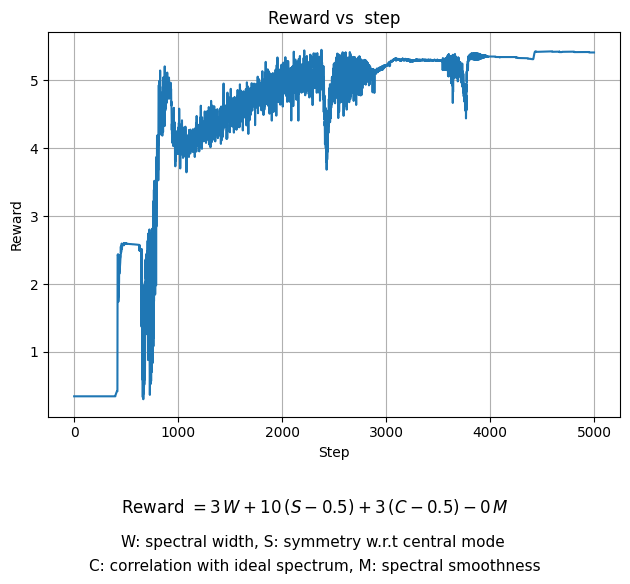

In [23]:
# collect the reward for each sample of spetra in ewg. take spec2 as reference and plot
ewg_dbm = 10*np.log10(np.abs(solver.sol.Ewg)**2)+30
ewg_dbm = np.clip(ewg_dbm, -60, 30)
cost_fn = []
for spec in ewg_dbm.T:
    cost = 2*spectral_width_dbm_torch(spec)+2*(spectral_symm(spec)) - 0*spectral_smoothness(spec) + 2*(np.corrcoef(spec, spec2)[0,1])
    cost_fn.append(cost)
plt.plot(cost_fn)
plt.xlabel('Step')
plt.ylabel('Reward')
plt.title('Reward vs  step')
plt.grid()
plt.figtext(0.5, -0.08, r'Reward $= 3\,W + 10\,(S-0.5) + 3\,(C-0.5) - 0\,M$', ha='center', fontsize=12)
plt.figtext(0.5, -0.15, r'W: spectral width, S: symmetry w.r.t central mode ', ha='center', fontsize=11)
plt.figtext(0.5, -0.2, r'C: correlation with ideal spectrum, M: spectral smoothness', ha='center', fontsize=11)
# mark with an arrow arounf 4800, 6 that single soliton
# plt.annotate('Single Soliton', xy=(4800, 6.6), xytext=(4000, 1
# 0),
#              arrowprops=dict(facecolor='black', shrink=0.05),
#              )
plt.tight_layout()
plt.show()

In [58]:
spectral_width_dbm_torch(ewg_dbm[:,700])

0.09333333333333334

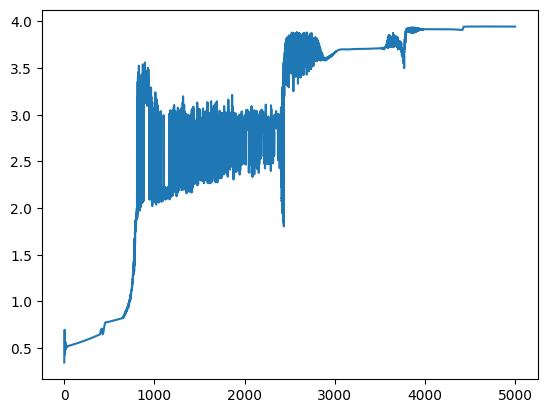

In [ ]:
reward = []
acav = 1000*np.abs(solver.sol.Acav.T)**2
# plt.plot(acav[4000])
for spec, acav_ in zip(ewg_dbm.T, acav):
    corr = np.corrcoef(spec,spec2)[0,1]
    if corr < 0.82:
        reward.append(10*np.mean(acav_) + 2*corr)
    else:
        reward.append(4*corr - 5*np.mean(acav_))
plt.plot(reward)

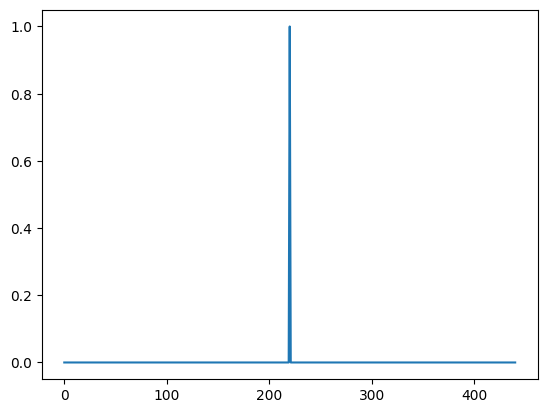

In [78]:
dropped = np.delete(ewg_dbm.T[0], len(ewg_dbm.T[0])//2, axis=0)
mask = ewg_dbm.T[0] >-55
plt.plot(mask)

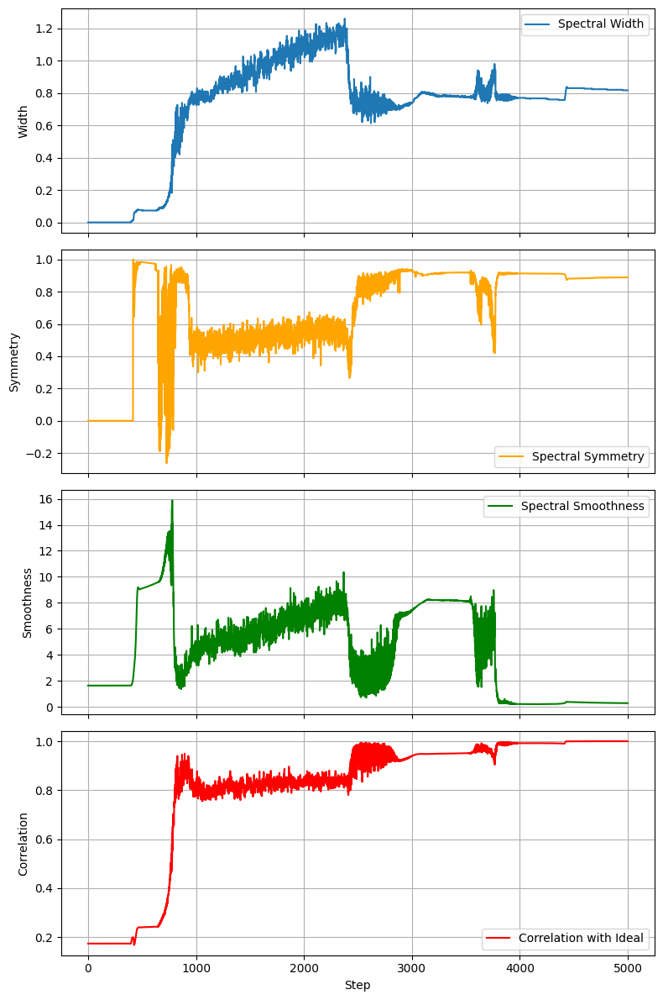

In [52]:
spec_width = []
symm = []
smooth = []
corr = []
for spec in ewg_dbm.T:
    spec_width.append(spectral_width_dbm_torch(spec))
    symm.append(spectral_symm(spec))
    smooth.append(spectral_smoothness(spec, window=10))
    corr.append(np.corrcoef(spec, spec2)[0,1])
# plot in plt subplots

fig, axs = plt.subplots(4, 1, figsize=(8, 12), sharex=True)
axs[0].plot(spec_width, label='Spectral Width')
axs[0].set_ylabel('Width') 
axs[0].legend()
axs[0].grid()
axs[1].plot(symm, label='Spectral Symmetry', color='orange')
axs[1].set_ylabel('Symmetry')
axs[1].legend()
axs[1].grid()
axs[2].plot(smooth, label='Spectral Smoothness', color='green')
axs[2].set_ylabel('Smoothness')
axs[2].legend()
axs[2].grid()
axs[3].plot(corr, label='Correlation with Ideal', color='red')
axs[3].set_ylabel('Correlation')
axs[3].set_xlabel('Step')
axs[3].legend()
axs[3].grid()
plt.tight_layout()


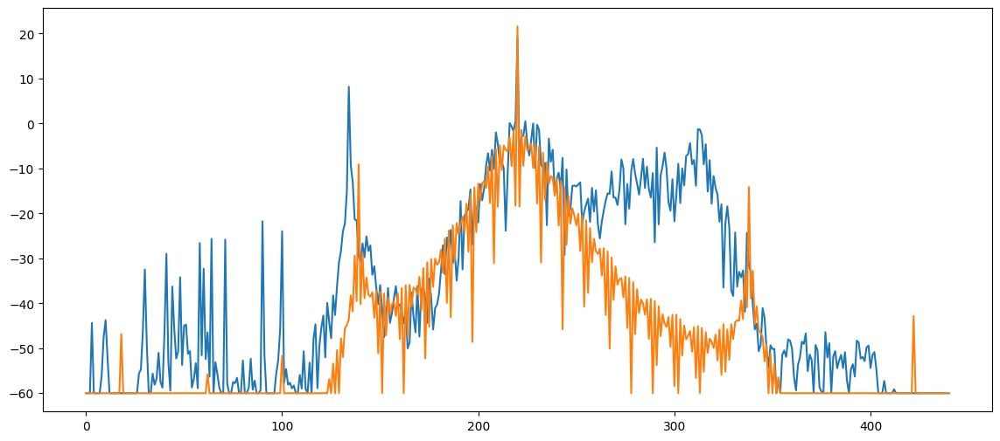

(2.0, 2.0)

In [88]:
import numpy as np
from scipy.signal import medfilt

def multi_soliton_modulation_metric(y_dbm, envelope_kernel=15):
    """
    Returns a value between 0 and 2 indicating strength of periodic modulation
    characteristic of multi-soliton states (compared to MI).
    """
    # Step 1: Remove envelope (median filter)
    envelope = medfilt(y_dbm, kernel_size=envelope_kernel)
    residual = y_dbm - envelope

    # Step 2: FFT of residual (sidebands expected for multi-soliton)
    ft = np.fft.fft(residual)
    ft_mag = np.abs(ft)[1:len(ft)//2]  # skip DC

    # Step 3: Normalize by RMS of residual
    norm_factor = np.sqrt(np.mean(residual**2)) + 1e-8
    modulation_strength = np.max(ft_mag) / norm_factor

    # Step 4: Bound output between 0 and 2
    return max(min(modulation_strength, 2.0), 0.0)

spec1 = 10*np.log10(np.abs(solver.sol.Ewg[:,2300])**2)+30
spec1 = np.clip(spec1,-60,30)
spec2 = 10*np.log10(np.abs(solver.sol.Ewg[:,3000])**2)+30
spec2 = np.clip(spec2,-60,30)
plt.figure(figsize=(14,6))
plt.plot(spec1, label='Spec 1')
plt.plot(spec2, label='Spec 2')
plt.show()
multi_soliton_modulation_metric(spec2), multi_soliton_modulation_metric(spec1)

## Reusing a DKS as an initialize state

Sometime it is convenient to seed the simulation with a soliton, for convergence reason or inverse Fourier Transform. To this extend we have implemented the possibility to provide an input that is not zero but instead can be any random vector

In the following cell I am loading the solution from the previous simulation. I saved in a .csv file that is in this folder in which I also saved the detuning at which thte solution has been found. This is needed to be able to stay on the stable branch of the DKS

In [ ]:
df = pd.read_csv('./DKS_init.csv')
df["DKS_init"] = df.DKS_init.apply(lambda val: complex(val.strip('()')))
δω = df.det.values[0] * 2*np.pi
DKS_init = df.DKS_init.values


In [65]:

res = dict(
        R=23e-6, 
        Qi=1e6, 
        Qc=1e6, 
        γ=3.2, 
        dispfile="./RW1000_H430.csv"
)


sim = dict(
    Pin=[160e-3], # need to be the same length than fmp
    f_pmp=[283e12], # if only one pump f_pmp=[283e12]
    φ_pmp=[0], # need to be the same length than fmp
    δω=[None], # None defined which pump to sweep
    Tscan=0.2e6,
    μ_sim=[-220, 220],
    δω_end = δω, δω_init = δω, 
    DKS_init =  DKS_init, 
)
solver = pyLLE.LLEsolver(sim=sim, res=res,debug=False)

fig = solver.Analyze(plot=False)
solver.Setup(verbose = False)
solver.SolveTemporal()
solver.RetrieveData()

----------------------------------------------------------------------
2022-09-09 16:22:04
Computing LLE [************************************************* ] 99%

Simulation Time 00h:00min:25.1s
----------------------------------------------------------------------


Note that here I performed a much shorter simulation than in the detuning swept case. It is alright given the convergence of the solution is ok, we did not apply any perturbation to our system and the detuning is fixed. Essentially we are probing how stable the solution is 

In the following cell, we will plot the temporal profile of the intracavity field Vs the LLE step and the resoantor angle: 

In [66]:
fig = go.Figure()
x = np.arange(0, 5000)
y = np.linspace(-0.5, 0.5, solver.sol.Acav.shape[0])
xsteps = 10
ysteps = 2
tr = go.Heatmap(x= x[::xsteps], y = y[::ysteps],  z = np.abs(solver.sol.Acav[::ysteps, ::xsteps])**2)
fig.add_trace(tr)
fig.update_layout(xaxis_title = "LLE subsampled step", 
                 yaxis_title = "Resonator angle θ (x π)")
                 
fig.show()

We started with the soliton, and we kept the soliton all along. Great! Seems a bit underwhelming but think that you could potentially apply any perturbative approach through this solver feature (noise, etc...)

## Freezing the soliton

In the previous simulation, we can notice that the soliton is actualy drifting with the LLE step, therefore in time. What it actualy means is the normalization of the LLE according to D1 is not the group rotation velocity coordinate of the soliton. It is well know that assymetry in the dispersion can lead to this kind of behavior. 
However, for many many reason (and I won't go in details here), it is super interesting to freeze the soliton envelope in time. 

In the solver, this can be simply achieved by implementing a manual D1 value as followed: 

In [63]:
df = pd.read_csv('./DKS_init.csv')
df["DKS_init"] = df.DKS_init.apply(lambda val: complex(val.strip('()')))
δω = df.det.values[0] * 2*np.pi
DKS_init = df.DKS_init.values

res = dict(
        R=23e-6, 
        Qi=1e6, 
        Qc=1e6, 
        γ=3.2, 
        dispfile="./RW1000_H430.csv"
)


sim = dict(
    Pin=[160e-3], # need to be the same length than fmp
    f_pmp=[283e12], # if only one pump f_pmp=[283e12]
    φ_pmp=[0], # need to be the same length than fmp
    δω=[None], # None defined which pump to sweep
    Tscan=0.2e6,
    μ_sim=[-220, 220],
    δω_end = δω, δω_init = δω, 
    DKS_init =  DKS_init, 
    D1_manual = 982.2557817183881 * 1e9 * 2*np.pi # linear is 982.2629817183881
)
solver = pyLLE.LLEsolver(sim=sim, res=res,debug=False)

fig = solver.Analyze(plot=False)
solver.Setup(verbose = False)
solver.SolveTemporal()
solver.RetrieveData()


----------------------------------------------------------------------
2022-09-09 16:18:08
Computing LLE [**************************************************] 100%

Simulation Time 00h:00min:25.9s
----------------------------------------------------------------------


In [64]:
fig = go.Figure()
x = np.arange(0, 5000)
y = np.linspace(-0.5, 0.5, solver.sol.Acav.shape[0])
xsteps = 10
ysteps = 2
tr = go.Heatmap(x= x[::xsteps], y = y[::ysteps],  z = np.abs(solver.sol.Acav[::ysteps, ::xsteps])**2)
fig.add_trace(tr)
fig.update_layout(xaxis_title = "LLE subsampled step", 
                 yaxis_title = "Resonator angle θ (x π)")
                 
fig.show()

Obviously, there is still a small drift, but to be honest I was lazy to actually compute correctly the shift of repetition rate and just did it manually. Long story short, you could figure it out and completely freezes the DKS in a coordinate system which moves at the same group velocity than the pulse

## Multi Pump Simulations

In [2]:
df = pd.read_csv('./DKS_init.csv')
df["DKS_init"] = df.DKS_init.apply(lambda val: complex(val.strip('()')))
δω = df.det.values[0] * 2*np.pi
DKS_init = df.DKS_init.values

res = dict(
        R=23e-6, 
        Qi=1e6, 
        Qc=1e6, 
        γ=3.2, 
        dispfile="./RW1000_H430.csv"
)


sim = dict(
    Pin=[160e-3, 10e-3], # need to be the same length than fmp
    f_pmp=[283e12, 240e12], # if only one pump f_pmp=[283e12]
    φ_pmp=[0, np.pi], # need to be the same length than fmp
    δω=[None, 0], # None defined which pump to sweep
    Tscan=0.2e6,
    μ_sim=[-220, 220],
    δω_end = δω, δω_init = δω, 
    DKS_init =  DKS_init, 
    D1_manual = 982.2557817183881 * 1e9 * 2*np.pi # linear is 982.2629817183881
)
solver = pyLLE.LLEsolver(sim=sim, res=res,debug=False)

fig = solver.Analyze(plot=True)

/zhome/d5/3/214816/viswa/fdtd_py/lib64/python3.9/site-packages/pyLLE/_llesolver.py:549: ComplexWarning:

Casting complex values to real discards the imaginary part



In [43]:
res = dict(
        R=23e-6, 
        Qi=1e6, 
        Qc=1e6, 
        γ=3.2, 
        dispfile="./RW1000_H430.csv"
)

sim = dict(
    Pin=[160e-3, 10e-3], # need to be the same length than fmp
    f_pmp=[283e12, 204e12], # if only one pump f_pmp=[283e12]
    φ_pmp=[0, np.pi], # need to be the same length than fmp
    δω=[None, 0], # None defined which pump to sweep 
    Tscan=0.7e6,
    μ_sim=[-220, 220],
    δω_init= 3e9 * 2 * np.pi,
    δω_end= -6.5e9 * 2 * np.pi,
    num_probe = 5000, 
)
solver = pyLLE.LLEsolver(sim=sim, res=res,debug=False)


fig = solver.Analyze(plot=True)

In the case of multi pumps, the integratied dispersion will be displayed, relative to the group velocity (i.e. repetition rate) relative to the first pump. It is coherence with Moille et al, Nature Communications 2021: 

In [44]:
solver.sim

+------------------------------------------------------------------------------------------------------------------+
|  Parameter          Description                  Values                                      Units               |
+------------------------------------------------------------------------------------------------------------------+
|  Pin                [160.000, 10.000] (mW)       Pump power                                  W                   |
|  Tscan              700000.0                     Simulation time length                      unit of round trip  |
|  f_pmp              [282.646, 204.067] (THz)     Pump frequencies                            Hz                  |
|  φ_pmp              [0, 3.141592653589793]       Pump phase                                  rad                 |
|  f_center           282.646 (THz)                Center of the sim domain                    Hz                  |
|  δω_init            3.000 (GHz)                  Start of the 

In [45]:
fig = solver.Analyze(plot=True)
fig.update_yaxes(range = [-50, 50], title = 'D<sub>int</sub> (GHz)')
fig.show()

In [46]:
fig = solver.Analyze(plot=False)
solver.Setup(verbose = True)
solver.SolveTemporal(bin='julia-1.11.1/bin/julia', verbose=True)
solver.RetrieveData()

-- Solving standard LLE --
	Simulation Parameters
		R = 23.00 µm
		Qi = 1.00 M
		Qc = 1.00 M
		γ = 3.20 
	Simulation Parameters
		Pin[0] = 160.00 mW
		Pin[1] = 10.00 mW
		f_pmp[0] = 282.65 THz
		f_pmp[1] = 204.07 THz
		Tscan = 0.70 x1e6 Round Trip
		μ_sim = [-220.00,220.00] 
		δω_init = 3.00 x2π GHz
		δω_end = -6.50 x2π GHz
		μ_fit = [None,None] 
		δω_stop = -6.50 x2π GHz
		ind_pump_sweep[0] = 0.00 

HDF5 parameter file can be foud in: /tmp/tmp4ryyxk0tParamLLEJulia.h5
----------------------------------------------------------------------
2025-11-21 09:50:48
Launching Julia....
Temp file can be found in: /tmp/tmp4ryyxk0tlog.log
Launching Julia: Done
Computing LLE [**************************************************] 100%

Simulation Time 00h:01min:45.7s
----------------------------------------------------------------------


In [49]:
fig = solver.PlotCombSpectra(4000, floor=-50, where='waveguide')
fig.update_yaxes(range = [-80, 30])
fig.show()

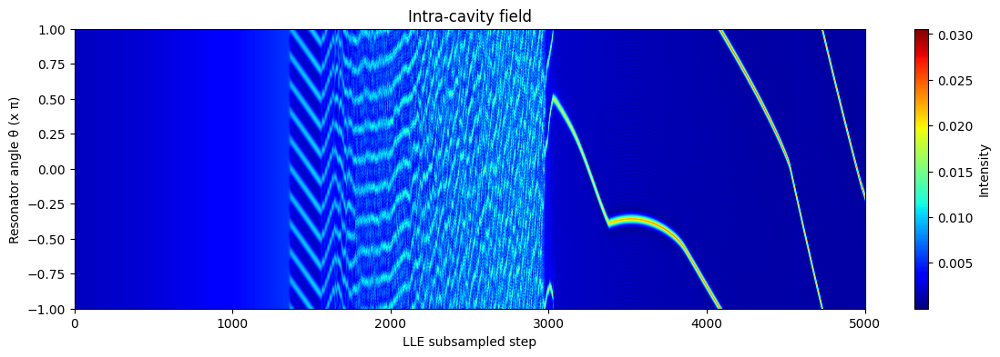

In [48]:
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 4))
plt.imshow(np.abs(solver.sol.Acav), aspect='auto', extent=[0, 5000, -1, 1], cmap='jet')
plt.xlabel("LLE subsampled step")
plt.ylabel("Resonator angle θ (x π)")
plt.title("Intra-cavity field")
plt.colorbar(label="Intensity")
plt.show()

Couple of stuff to unpack here:  
- here I assumed that the second pump was small enough to consider it as a perturbation, which is semi-true. At high enough power, the repetition rate will be changed (see Miro Erkintalo papers, Hossein Taheri's among others)
- We can clearly see new DW appearing. For complete explanation see our Nature comm paper (and soon a new one :) )